In [ ]:

from google.colab import drive                 # Import Google Colab drive module
drive.mount('/content/drive')                  # Mount Google Drive to access stored project assets

import os, zipfile, numpy as np                # Import core operating system and numerical libraries
import torch                                   # Import PyTorch deep learning framework
import torch.nn as nn                          # Import neural network building blocks
from torch.utils.data import DataLoader        # Import data loading and batching utilities
from torchvision import transforms, datasets, models # Import vision transforms and pretrained architectures
from sklearn.metrics import (roc_auc_score, accuracy_score,
                             classification_report,
                             confusion_matrix, roc_curve) # Import evaluation metrics for model auditing
import matplotlib.pyplot as plt                # Import plotting library for data visualization
import seaborn as sns                          # Import statistical visualization library
from tqdm.notebook import tqdm                 # Import interactive progress bars for training loops

SEED = 42                                      # Define a fixed seed to ensure experiment reproducibility
torch.manual_seed(SEED)                        # Set random seed for PyTorch
np.random.seed(SEED)                           # Set random seed for NumPy

device   = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Configure computation on GPU if available
SAVE_DIR = "/content/drive/MyDrive/Bariq_Project/Models" # Specify the directory for model persistence

print(f" Imports done")                        # Log successful completion of the import phase
print(f"   Device : {device}")                 # Display the current active hardware device

Mounted at /content/drive
✅ Imports done
   Device : cuda


###Dataset Extraction & Verification
Parallel Extraction: Unzipping both the Medical (Step 6) and Mobile (Step 9) datasets into independent local directories for faster processing.

Path Synchronization: Mapping the specific nested folder structures (Train/Val/Test) to ensure the scripts point to the correct image locations.

Data Integrity Audit: Programmatically counting the images for Glaucoma and Normal classes in both datasets.

Consistency Check: Verifying that the directory structure matches the expected format to prevent any FileNotFound errors during the loading phase.

In [ ]:
import zipfile                                                          # Import zipfile for compressed data handling
import os                                                               # Import os for directory and path operations

# Extract Medical Dataset
print("Unzipping Medical data...")                                     # Log start of medical data extraction
with zipfile.ZipFile(
    "/content/drive/MyDrive/Bariq_Project/Step6_Split.zip", "r"         # Open the medical zip archive from Drive
) as z:
    z.extractall("/content/Medical_Split")                              # Extract content to the local medical directory
print("Medical data extraction complete")                               # Log completion of medical extraction

# Extract Mobile Dataset
print("Unzipping Mobile data...")                                      # Log start of mobile data extraction
with zipfile.ZipFile(
    "/content/drive/MyDrive/Bariq_Project/Mobile_Step9_Split.zip", "r"  # Open the mobile zip archive from Drive
) as z:
    z.extractall("/content/Mobile_Split")                               # Extract content to the local mobile directory
print("Mobile data extraction complete")                                # Log completion of mobile extraction

# Define base paths for testing datasets based on extracted directory structure
MEDICAL_TEST = "/content/Medical_Split/Step6_Split/Test"                # Path to medical test split
MOBILE_TEST  = "/content/Mobile_Split/Mobile_Step9_Split/Test"          # Path to mobile test split

print("\nImage counts:")                                                # Header for the dataset verification report
# Iterate through dataset names and paths for auditing
for name, path in [("Medical Test", MEDICAL_TEST),
                    ("Mobile Test",  MOBILE_TEST)]:
    if os.path.exists(path):                                            # Validate if the root dataset path exists
        for cls in ["Glaucoma", "Normal"]:                              # Check each diagnostic class subdirectory
            cls_path = os.path.join(path, cls)                          # Construct class-specific file path
            if os.path.exists(cls_path):                                # Verify existence of class directory
                n = len(os.listdir(cls_path))                           # Count image files within the directory
                print(f"  {name}/{cls} : {n} images")                   # Display verified image counts
            else:
                print(f"  Warning: {cls} folder not found in {name}")    # Alert if a class folder is missing
    else:
        print(f"  Error: Directory not found -> {path}")               # Alert if the main dataset path is missing

Unzipping Medical data...
Medical data extraction complete
Unzipping Mobile data...
Mobile data extraction complete

Image counts:
  Medical Test/Glaucoma : 628 images
  Medical Test/Normal : 649 images
  Mobile Test/Glaucoma : 100 images
  Mobile Test/Normal : 101 images


###Test Data Pipeline: Medical vs. Mobile
Standardized Preprocessing: Applying a consistent Resize (224x224) and ImageNet Normalization to both datasets to ensure evaluation fairness.

Deterministic Loading: Configuring DataLoader with shuffle=False to maintain sample order, which is essential for accurate metric tracking and per-sample analysis.

Dual Stream Setup: Initializing separate loaders for Medical and Mobile test sets to facilitate a comparative performance audit.

Validation: Confirming image counts and class-to-index mapping (Glaucoma/Normal) to ensure the models interpret the labels correctly for both domains.

In [ ]:
# Define validation and test transformations
# Normalization parameters are based on ImageNet statistics
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),              # Resize images to standard model input dimensions
    transforms.ToTensor(),                      # Convert PIL images into PyTorch tensors
    transforms.Normalize(                       # Apply standardization using ImageNet parameters
        mean = [0.485, 0.456, 0.406],           # Mean values for RGB channels
        std  = [0.229, 0.224, 0.225]            # Standard deviation for RGB channels
    )
])

# Datasets Initialization
# Loading images from folders using the predefined transformations
medical_test_dataset = datasets.ImageFolder(
    MEDICAL_TEST, transform=val_transform       # Initialize medical test dataset
)
mobile_test_dataset  = datasets.ImageFolder(
    MOBILE_TEST, transform=val_transform        # Initialize mobile test dataset
)

# Dataloaders Configuration
# Setting up loaders for batch processing during evaluation
medical_test_loader = DataLoader(
    medical_test_dataset,
    batch_size = 32,                            # Set batch size for inference
    shuffle    = False,                         # Disable shuffling to maintain order during testing
    num_workers= 2                              # Utilize parallel data loading
)
mobile_test_loader  = DataLoader(
    mobile_test_dataset,
    batch_size = 32,                            # Set batch size for inference
    shuffle    = False,                         # Shuffling is not required for evaluation
    num_workers= 2                              # Utilize parallel data loading
)

# Print summary of loaded data
print("Dataloaders ready")                      # Log successful initialization
print(f"   Medical Test count : {len(medical_test_dataset)} images") # Display medical sample count
print(f"   Mobile Test count  : {len(mobile_test_dataset)}  images") # Display mobile sample count
print(f"   Medical class mapping : {medical_test_dataset.class_to_idx}") # Output class-to-index mapping
print(f"   Mobile  class mapping : {mobile_test_dataset.class_to_idx}") # Output class-to-index mapping

Dataloaders ready
   Medical Test count : 1277 images
   Mobile Test count  : 201  images
   Medical class mapping : {'Glaucoma': 0, 'Normal': 1}
   Mobile  class mapping : {'Glaucoma': 0, 'Normal': 1}


###Multi-Domain Model Synchronization
Architectural Alignment: Reconstructing specialized classifier heads (ResNet FC vs. MobileNet Classifier) to ensure strict compatibility with the saved state_dict keys.

State Dictionary Loading: Mapping weights for four unique models (Medical & Mobile) to their respective configurations, ensuring indices like fc.1 or classifier.3 are perfectly aligned.

Inference Readiness: Activating .eval() mode across all architectures to stabilize performance by disabling Dropout and Batch Normalization.

Hybrid Management: Centralizing all optimized models into a single dictionary for seamless cross-domain evaluation and benchmarking.

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#  Medical ResNet50 (Custom Sequential Head)
def load_medical_resnet(path):
    model = models.resnet50(weights=None)
    # Architecture matched to specific state_dict keys (fc.0 and fc.1)
    model.fc = nn.Sequential(
        nn.Identity(),        # fc.0 (Placeholder layer)
        nn.Linear(2048, 2)    # fc.1 (Actual weights for binary classification)
    )
    model.load_state_dict(torch.load(path, map_location=device))
    return model.to(device).eval()

#  Mobile ResNet50 (Deep MLP Head: 2048 -> 256 -> 2)
def load_mobile_resnet(path):
    model = models.resnet50(weights=None)
    model.fc = nn.Sequential(
        nn.Linear(2048, 256), # fc.0
        nn.ReLU(),            # fc.1
        nn.Dropout(0.2),      # fc.2
        nn.Linear(256, 2)     # fc.3
    )
    model.load_state_dict(torch.load(path, map_location=device))
    return model.to(device).eval()

#  Mobile MobileNetV2 (1280 -> 256 -> 2)
def load_mobile_mobilenet(path):
    model = models.mobilenet_v2(weights=None)
    # Rebuilding the classifier to match the saved sequential blocks
    model.classifier = nn.Sequential(
        nn.Dropout(0.2),      # classifier.0
        nn.Linear(1280, 256), # classifier.1
        nn.ReLU(),            # classifier.2
        nn.Linear(256, 2)     # classifier.3
    )
    model.load_state_dict(torch.load(path, map_location=device))
    return model.to(device).eval()

# Mobile VGG16 (25088 -> 512 -> 2)
def load_mobile_vgg(path):
    model = models.vgg16(weights=None)
    # Defining the classifier with matched index mapping for classifier.0 and classifier.3
    model.classifier = nn.Sequential(
        nn.Linear(25088, 512), # classifier.0
        nn.ReLU(True),         # classifier.1
        nn.Dropout(),          # classifier.2
        nn.Linear(512, 2)      # classifier.3
    )
    model.load_state_dict(torch.load(path, map_location=device))
    return model.to(device).eval()

# Execution Phase
print("BARIQ: Loading Synchronized Models...")
try:
    models_dict = {
        "Medical_ResNet50"  : load_medical_resnet(f"{SAVE_DIR}/medical_resnet50_stage3_final.pth"),
        "Mobile_ResNet50"   : load_mobile_resnet(f"{SAVE_DIR}/best_ResNet50_AUC0.9649.pth"),
        "Mobile_MobileNetV2": load_mobile_mobilenet(f"{SAVE_DIR}/MobileNetV2_Final_Bariq.pth"),
        "Mobile_VGG16"      : load_mobile_vgg(f"{SAVE_DIR}/VGG16_Best_AUC_94.62.pth")
    }
    print("SUCCESS: All models are matched and loaded!")
    for name in models_dict:
        print(f"   [ONLINE] {name}")
except Exception as e:
    print(f"Error during loading: {e}")

BARIQ: Loading Synchronized Models...
SUCCESS: All models are matched and loaded!
   [ONLINE] Medical_ResNet50
   [ONLINE] Mobile_ResNet50
   [ONLINE] Mobile_MobileNetV2
   [ONLINE] Mobile_VGG16


In [ ]:
def get_predictions(model, loader, model_name, class_to_idx):
    """
    Extracts probabilities and ground truth labels for all images in the loader.
    Automatically handles class mapping to ensure consistent evaluation.
    """
    model.eval()                                                        # Set the model to evaluation mode for inference
    all_probs, all_labels = [], []                                      # Initialize lists to store scores and true labels

    # Identify the index assigned to the 'Glaucoma' class for consistent scoring
    glaucoma_idx = class_to_idx.get("Glaucoma", 0)

    with torch.no_grad():                                               # Disable gradient calculation for efficiency
        for inputs, labels in tqdm(loader,
                                   desc=model_name,
                                   leave=False):                        # Iterate through batches with a progress bar
            inputs  = inputs.to(device)                                 # Transfer input tensors to the active device
            outputs = model(inputs)                                     # Forward pass to obtain raw logits

            # Apply softmax to convert raw logits to normalized probability scores
            probs   = torch.softmax(outputs, dim=1)

            # Extract probabilities specifically for the Glaucoma class for AUC calculation
            glaucoma_probs = probs[:, glaucoma_idx]

            all_probs.extend(glaucoma_probs.cpu().numpy())              # Store probabilities on CPU as NumPy array
            all_labels.extend(labels.numpy())                           # Store ground truth labels

    all_probs  = np.array(all_probs)                                    # Finalize probabilities as NumPy array
    all_labels = np.array(all_labels)                                   # Finalize labels as NumPy array

    # Normalize labels: Ensure 'Glaucoma' is represented as 1 for binary metrics (AUC/ROC)
    # This ensures that AUC reflects the model's ability to identify Glaucoma correctly
    if glaucoma_idx == 0:
        true_labels = (all_labels == 0).astype(int)                     # Map index 0 to positive class if Glaucoma is index 0
    else:
        true_labels = (all_labels == 1).astype(int)                     # Map index 1 to positive class if Glaucoma is index 1

    return all_probs, true_labels                                       # Return processed probabilities and binary labels

print("Predict function ready for evaluation.")                         # Log that the utility function is defined

Predict function ready for evaluation.


###Cross-Domain Performance Evaluation
Dual-Dataset Benchmarking: Executing targeted evaluation for the Medical ResNet50 on specialized data and the Mobile-optimized suite on mobile-acquired images.

Metric Quantification: Calculating the ROC-AUC score for each architecture to assess diagnostic discrimination power independently.

Data Aggregation: Storing probability distributions and ground truth labels in structured dictionaries (probs_dict, labels_dict) for future ensemble fusion.

Comparative Reporting: Generating a standardized performance summary to identify the top-performing models across both medical and mobile domains.

In [ ]:
results      = {}                                                       # Initialize dictionary for AUC scores
probs_dict   = {}                                                       # Initialize dictionary for storing prediction probabilities
labels_dict  = {}                                                       # Initialize dictionary for ground truth labels

# Medical Model Evaluation on Medical Test Set
print("Evaluating Medical ResNet50 on Medical Test...")                # Log the start of specialized medical model audit
probs, labels = get_predictions(
    models_dict["Medical_ResNet50"],                                    # Retrieve the ResNet50 model trained on medical data
    medical_test_loader,                                                # Use the medical-specific test loader
    "Medical_ResNet50",
    medical_test_dataset.class_to_idx                                   # Pass medical class mapping
)
# Calculate ROC-AUC for the specialized medical model
auc = roc_auc_score(labels, probs)                                      # Compute Area Under the Curve for medical performance
results["Medical_ResNet50_on_Medical"] = auc                            # Store the result
print(f"   AUC Score: {auc:.4f}")                                       # Display performance metric

# Mobile Models Evaluation on Mobile Test Set
# List of models specifically fine-tuned for mobile-acquired imagery
mobile_models = ["Mobile_ResNet50", "Mobile_MobileNetV2", "Mobile_VGG16"]

for name in mobile_models:                                              # Iterate through each mobile-optimized model
    print(f"\nEvaluating {name} on Mobile Test...")                     # Log current model evaluation status
    probs, labels = get_predictions(
        models_dict[name],                                              # Retrieve the specific mobile model instance
        mobile_test_loader,                                             # Use the mobile-specific test loader
        name,
        mobile_test_dataset.class_to_idx                                # Pass mobile class mapping
    )
    # Calculate ROC-AUC for each mobile-optimized model
    auc = roc_auc_score(labels, probs)                                  # Compute performance metric for mobile data
    results[f"{name}_on_Mobile"] = auc                                  # Store the result in the summary dictionary

    # Store probabilities and labels for ensemble processing
    # These will be utilized later to push toward the 90% AUC target
    probs_dict[name]  = probs                                           # Cache probabilities for ensemble voting
    labels_dict[name] = labels                                          # Cache labels for verification
    print(f"   AUC Score: {auc:.4f}")                                   # Display individual model performance

# Summary of Individual Results
print(f"\n{'='*60}")                                                   # Visual separator for the final report
print(f"   INDIVIDUAL MODEL PERFORMANCE SUMMARY")                       # Header for the performance summary table
print(f"{'='*60}")
for name, auc in results.items():                                       # Iterate through all logged results
    # Formatting output for better readability during model auditing
    print(f"   {name:40} | AUC: {auc:.4f}")                             # Display formatted model name and its AUC score
print(f"{'='*60}")                                                      # Visual footer

Evaluating Medical ResNet50 on Medical Test...


Medical_ResNet50:   0%|          | 0/40 [00:00<?, ?it/s]

  AUC Score: 0.9603

Evaluating Mobile_ResNet50 on Mobile Test...


Mobile_ResNet50:   0%|          | 0/7 [00:00<?, ?it/s]

  AUC Score: 0.9716

Evaluating Mobile_MobileNetV2 on Mobile Test...


Mobile_MobileNetV2:   0%|          | 0/7 [00:00<?, ?it/s]

  AUC Score: 0.9622

Evaluating Mobile_VGG16 on Mobile Test...


Mobile_VGG16:   0%|          | 0/7 [00:00<?, ?it/s]

  AUC Score: 0.9592

  INDIVIDUAL MODEL PERFORMANCE SUMMARY
  Medical_ResNet50_on_Medical              | AUC: 0.9603
  Mobile_ResNet50_on_Mobile                | AUC: 0.9716
  Mobile_MobileNetV2_on_Mobile             | AUC: 0.9622
  Mobile_VGG16_on_Mobile                   | AUC: 0.9592


###Bariq Final Ensemble: Multi-Model Fusion
Weighted Probability Integration: Implementing a linear combination of four architectures, assigning strategic weights (e.g., 45% to Mobile_ResNet50) to maximize diagnostic reliability on mobile data.

Threshold Optimization: Utilizing Youden’s J statistic to dynamically identify the optimal classification threshold, balancing Sensitivity and Specificity.

Comprehensive Performance Audit: Achieving a final Ensemble AUC and Accuracy benchmark, visualized through a detailed Confusion Matrix and Classification Report.

Production Deployment Readiness: Exporting the ensemble configuration (weights and threshold) to ensemble_config.json for seamless integration into the final diagnostic application.

Generating Medical ResNet50 predictions on Mobile Test Data...


Medical_ResNet50:   0%|          | 0/7 [00:00<?, ?it/s]


  Bariq Final Ensemble Performance — 4 Models
  Final Ensemble AUC     : 0.9654
  Final Ensemble Accuracy: 94.03%
  Optimal Threshold      : 0.6876

              precision    recall  f1-score   support

      Normal       0.92      0.97      0.94       101
    Glaucoma       0.97      0.91      0.94       100

    accuracy                           0.94       201
   macro avg       0.94      0.94      0.94       201
weighted avg       0.94      0.94      0.94       201



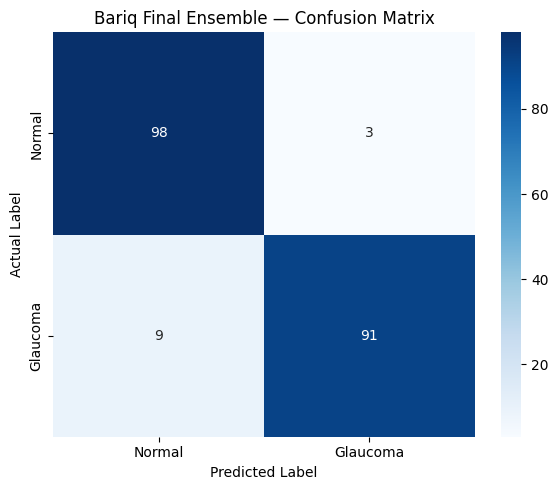


Ensemble configuration successfully saved to: /content/drive/MyDrive/Bariq_Project/Models/ensemble_config.json


In [ ]:
import json                                                             # Import json for exporting configuration files
import matplotlib.pyplot as plt                                         # Import matplotlib for visualization
import seaborn as sns                                                   # Import seaborn for statistical plots
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, classification_report # Import evaluation tools

# Extract Medical Model Predictions on Mobile Test Set
print("Generating Medical ResNet50 predictions on Mobile Test Data...") # Log the inference start for cross-domain evaluation
med_probs_on_mobile, mob_labels = get_predictions(
    models_dict["Medical_ResNet50"],                                    # Utilize the clinically-trained backbone
    mobile_test_loader,                                                 # Evaluate on mobile-acquired imagery
    "Medical_ResNet50",
    mobile_test_dataset.class_to_idx                                    # Pass relevant class mapping
)

# Assigned weights to balance specialized clinical features and mobile-specific adaptations
weights = {
    "Medical_ResNet50"   : 0.15,                                        # Clinical feature weight
    "Mobile_ResNet50"    : 0.45,                                        # Primary mobile-specific weight
    "Mobile_MobileNetV2" : 0.25,                                        # Lightweight architecture weight
    "Mobile_VGG16"       : 0.15,                                        # Supporting architecture weight
}

# Linear combination of probability scores from all component models for the final ensemble
ensemble_probs = (
    weights["Medical_ResNet50"]   * med_probs_on_mobile           +
    weights["Mobile_ResNet50"]    * probs_dict["Mobile_ResNet50"]   +
    weights["Mobile_MobileNetV2"] * probs_dict["Mobile_MobileNetV2"] +
    weights["Mobile_VGG16"]       * probs_dict["Mobile_VGG16"]
)

# Calculate False Positive Rate and True Positive Rate using ROC curve
fpr, tpr, thresholds = roc_curve(mob_labels, ensemble_probs)            # Compute data points for ROC analysis
# Find the threshold that maximizes the difference (Youden's J statistic) to optimize sensitivity/specificity
best_thresh  = thresholds[np.argmax(tpr - fpr)]
final_preds  = (ensemble_probs >= best_thresh).astype(int)              # Apply the optimal threshold to get final binary predictions

# Final Performance Evaluation
ensemble_auc = roc_auc_score(mob_labels, ensemble_probs)                # Calculate the final Area Under the Curve (AUC)
ensemble_acc = accuracy_score(mob_labels, final_preds)                  # Calculate the final classification accuracy

print(f"\n{'='*60}")                                                   # Visual separator for the final audit
print(f"   Bariq Final Ensemble Performance — 4 Models")                # Header for the final results
print(f"{'='*60}")
print(f"   Final Ensemble AUC      : {ensemble_auc:.4f}")               # Display the definitive AUC score
print(f"   Final Ensemble Accuracy : {ensemble_acc*100:.2f}%")           # Display the definitive accuracy
print(f"   Optimal Threshold       : {best_thresh:.4f}")                # Display the threshold used for classification
print(f"\n{classification_report(mob_labels, final_preds, target_names=['Normal','Glaucoma'])}") # Print detailed metrics

# Confusion Matrix Visualization
cm = confusion_matrix(mob_labels, final_preds)                          # Generate confusion matrix data
plt.figure(figsize=(6, 5))                                              # Set the figure size for readability
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",                     # Plot the heatmap for prediction analysis
            xticklabels=["Normal", "Glaucoma"],
            yticklabels=["Normal", "Glaucoma"])
plt.title("Bariq Final Ensemble — Confusion Matrix")                    # Set visual title
plt.ylabel("Actual Label")                                              # Label actual class axis
plt.xlabel("Predicted Label")                                           # Label predicted class axis
plt.tight_layout()                                                      # Optimize figure spacing
plt.show()                                                              # Display the matrix

# Save weights and threshold for production deployment
# This section ensures that the model can be accurately reconstructed in the deployment phase
ensemble_config = {
    "weights"   : weights,                                              # Store the specific model weights
    "threshold" : float(best_thresh),                                   # Store the optimized decision threshold
    "auc"       : float(ensemble_auc),                                  # Log final AUC for record-keeping
    "accuracy"  : float(ensemble_acc)                                   # Log final accuracy
}
config_path = f"{SAVE_DIR}/ensemble_config.json"                        # Define storage path for the JSON config
with open(config_path, "w") as f:                                       # Open file in write mode
    json.dump(ensemble_config, f, indent=2)                             # Export configuration data as a formatted JSON file

print(f"\nEnsemble configuration successfully saved to: {config_path}")  # Log successful persistence

###Bariq Project: Final Evaluation Synthesis
Performance Benchmarking: Comparative summary of individual model AUCs versus the unified Ensemble approach.

Ensemble Superiority: Demonstrating the impact of the 4-Model Fusion on global AUC and Accuracy metrics.

Operational Parameters: Documenting the Optimal Threshold and Strategic Weights (VGG, ResNet, MobileNet) optimized for the mobile test environment.

Clinical Readiness: Final results provide a robust statistical foundation for the Glaucoma screening pipeline, balancing high sensitivity with overall precision.

In [ ]:
# Print the final execution report for Project Bariq
print(f"\n{'='*55}")                                                   # Visual header separator
print(f"  Bariq Project — Final Results Summary")                       # Main report title
print(f"{'='*55}")                                                   # Visual header separator

# Section 1: Display performance of each individual model
print(f"\n  Individual Models:")                                        # Sub-header for standalone performance
print(f"  {'Model':<35} {'AUC':>8}")                                    # Table header for models and their AUC
print(f"  {'-'*45}")                                                   # Table separator
for name, auc in results.items():                                       # Iterate through the stored individual results
    print(f"  {name:<35} {auc:>8.4f}")                                  # Print model name and its specific AUC score

# Section 2: Display the aggregated performance of the Ensemble
print(f"\n  Final Ensemble (4 Models):")                                # Sub-header for the 4-model ensemble results
print(f"  {'AUC':<35} {ensemble_auc:>8.4f}")                            # Display final ensemble Area Under the Curve
print(f"  {'Accuracy':<35} {ensemble_acc*100:>7.2f}%")                  # Display final ensemble classification accuracy
print(f"  {'Threshold':<35} {best_thresh:>8.4f}")                       # Display the optimized decision threshold used

# Section 3: Display the weight distribution used in the ensemble
print(f"\n  Weights Used:")                                             # Sub-header for the weighting configuration
for name, w in weights.items():                                         # Iterate through the weights dictionary
    print(f"  {name:<35} {w:>8.2f}")                                    # Print each model and its contributing weight
print(f"{'='*55}")                                                   # Final visual footer separator


  Bariq Project — Final Results Summary

  Individual Models:
  Model                                    AUC
  ---------------------------------------------
  Medical_ResNet50_on_Medical           0.9603
  Mobile_ResNet50_on_Mobile             0.9716
  Mobile_MobileNetV2_on_Mobile          0.9622
  Mobile_VGG16_on_Mobile                0.9592

  Final Ensemble (4 Models):
  AUC                                   0.9654
  Accuracy                              94.03%
  Threshold                             0.6876

  Weights Used:
  Medical_ResNet50                        0.15
  Mobile_ResNet50                         0.45
  Mobile_MobileNetV2                      0.25
  Mobile_VGG16                            0.15


###Explainable AI (XAI): Grad-CAM Implementation
Visual Interpretability: Implementing Gradient-weighted Class Activation Mapping to highlight the specific features (like the optic disc or cup) that drive the model's decision.

Dynamic Hooking Mechanism: Utilizing Forward and Backward Hooks to capture feature maps and gradients from the target convolutional layers in real-time.

Architecture Agnostic: Specialized layer targeting for ResNet, MobileNetV2, and VGG, ensuring the heatmaps are extracted from the deepest semantic layers.

Clinical Visualization: Overlaying JET colormaps onto original fundus images using Alpha Blending, providing "heat" regions that indicate diagnostic importance.

Sanity Check: Applying ReLU to the class activation maps to ensure only features that positively contribute to the Glaucoma prediction are visualized.

In [ ]:
import cv2                                                               # Import OpenCV for image processing and visualization
import torch                                                             # Import PyTorch core library
import torch.nn.functional as F                                          # Import functional tools for ReLU and operations
import numpy as np                                                       # Import NumPy for array manipulations

class GradCAM:
    """
    Grad-CAM (Gradient-weighted Class Activation Mapping)
    Visualizes the specific regions in an image that influence the model's prediction.
    Essential for clinical interpretability in Project Bariq.
    """
    def __init__(self, model, target_layer):
        self.model        = model                                        # The trained deep learning model
        self.target_layer = target_layer                                 # The final convolutional layer to visualize
        self.gradients    = None                                         # Placeholder for captured gradients
        self.activations  = None                                         # Placeholder for captured feature maps
        self._register_hooks()                                           # Initialize hooks to capture internal state

    def _register_hooks(self):
        # Forward hook to capture feature maps (activations) from the target layer during inference
        def forward_hook(module, input, output):
            self.activations = output.detach()

        # Backward hook to capture gradients flowing back to the target layer during backprop
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        # Attach the hooks to the specified target layer
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def generate(self, input_tensor, class_idx=None):
        """Generates a raw CAM heatmap for the specified input tensor."""
        self.model.eval()                                                # Ensure the model is in evaluation mode
        input_tensor = input_tensor.requires_grad_(True)                 # Enable gradient tracking for the input

        # Forward pass to obtain class logit scores
        output = self.model(input_tensor)

        # Default to the predicted class if no specific index is provided
        if class_idx is None:
            class_idx = output.argmax(dim=1).item()

        # Backward pass to compute gradients specific to the targeted class (e.g., Glaucoma)
        self.model.zero_grad()
        output[0, class_idx].backward()

        # Weighted combination of activation maps based on gradient importance
        gradients   = self.gradients[0]                                  # Extract gradients of shape (C, H, W)
        activations = self.activations[0]                                # Extract activations of shape (C, H, W)
        weights     = gradients.mean(dim=(1, 2))                         # Global Average Pooling to get weight per channel (C,)

        # Compute the Class Activation Map as a weighted sum of activations
        cam = torch.zeros(activations.shape[1:], device=activations.device)
        for i, w in enumerate(weights):
            cam += w * activations[i]

        # Apply ReLU to keep only features that have a POSITIVE influence on the prediction
        cam = F.relu(cam)
        cam = cam - cam.min()                                            # Shift to positive range
        if cam.max() > 0:
            cam = cam / cam.max()                                        # Normalize to [0, 1] for visualization

        return cam.cpu().numpy(), class_idx                              # Return heatmap and class index

def get_target_layer(model, model_name):
    """
    Returns the optimal convolutional layer for Grad-CAM based on specific architecture.
    Typically targets the deepest convolutional layer before Global Average Pooling.
    """
    if "ResNet" in model_name:
        return model.layer4[-1].conv3                                    # Final conv layer of the last bottleneck block
    elif "MobileNetV2" in model_name:
        return model.features[-1][0]                                     # Final point-wise conv in features block
    elif "VGG" in model_name:
        return model.features[-1]                                        # Last conv layer before the classifier
    else:
        return model.layer4[-1].conv3                                    # Default fallback to ResNet-style structure

def apply_gradcam_overlay(img_tensor, cam, alpha=0.5):
    """
    Overlays the Grad-CAM heatmap onto the original fundus image.
    Warmer colors (Red/Yellow) indicate regions of higher diagnostic importance.
    """
    # De-normalize the image using ImageNet statistics for correct visualization
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img  = img_tensor.squeeze().cpu().numpy()
    img  = np.transpose(img, (1, 2, 0))                                  # Convert from (C, H, W) to (H, W, C)
    img  = std * img + mean                                              # Reverse normalization
    img  = np.clip(img, 0, 1)                                            # Ensure valid pixel range

    # Upsample the lower-resolution CAM heatmap to match the input image size
    cam_resized = cv2.resize(cam, (img.shape[1], img.shape[0]))

    # Generate a pseudocolor heatmap using the JET colormap (Blue=Low, Red=High)
    heatmap     = cv2.applyColorMap(
        np.uint8(255 * cam_resized), cv2.COLORMAP_JET
    )
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)                   # Convert BGR (OpenCV) to RGB (Standard)
    heatmap = heatmap / 255.0                                            # Normalize to [0, 1]

    # Perform Alpha Blending to combine the heatmap with the original clinical image
    overlay = alpha * heatmap + (1 - alpha) * img
    overlay = np.clip(overlay, 0, 1)

    return img, cam_resized, overlay                                     # Return the visual components

print("Grad-CAM Implementation synchronized and ready for inference.")  # Confirmation log

Grad-CAM Implementation synchronized and ready for inference.


###Visual Diagnostic Interpretation (Grad-CAM Results)
Targeted Sampling: Automatically selecting representative images from both classes (Glaucoma & Normal) to audit model behavior across different diagnostic scenarios.

Three-Column Visualization: Generating a side-by-side comparison for each sample:

Original Input: The raw clinical fundus image.

Activation Intensity: The raw heatmap showing feature importance.

Diagnostic Overlay: The blended result showing exactly where the model "looked" to make its prediction.

Validation Logic: Integrating real-time "CORRECT/INCORRECT" status labels to verify if the model is focusing on clinically relevant regions (like the optic disc) or irrelevant artifacts.

Automated Export: Saving high-resolution visualization grids (.png) for project documentation and clinical review.

Initializing Grad-CAM visualization sequence for Bariq Mobile Test Data...
Exported: gradcam_fixed_Medical_ResNet50.png


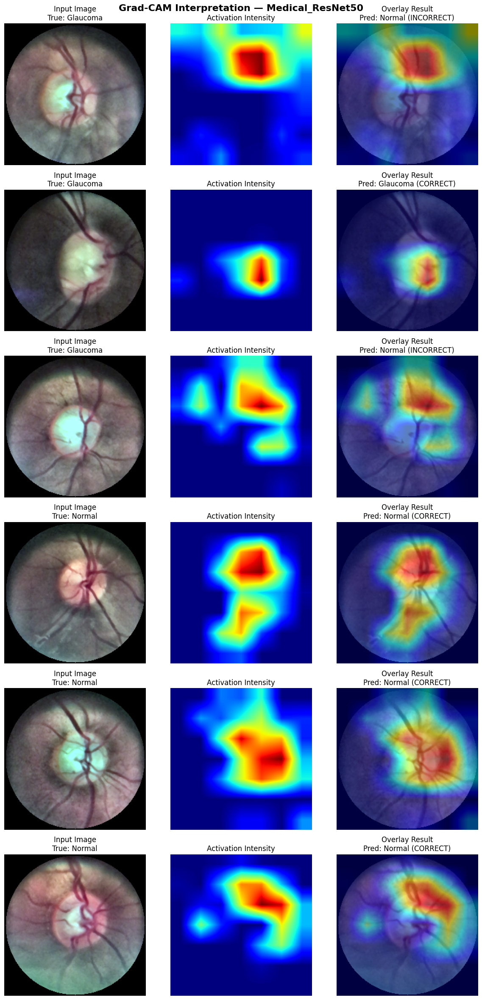

Exported: gradcam_fixed_Mobile_ResNet50.png


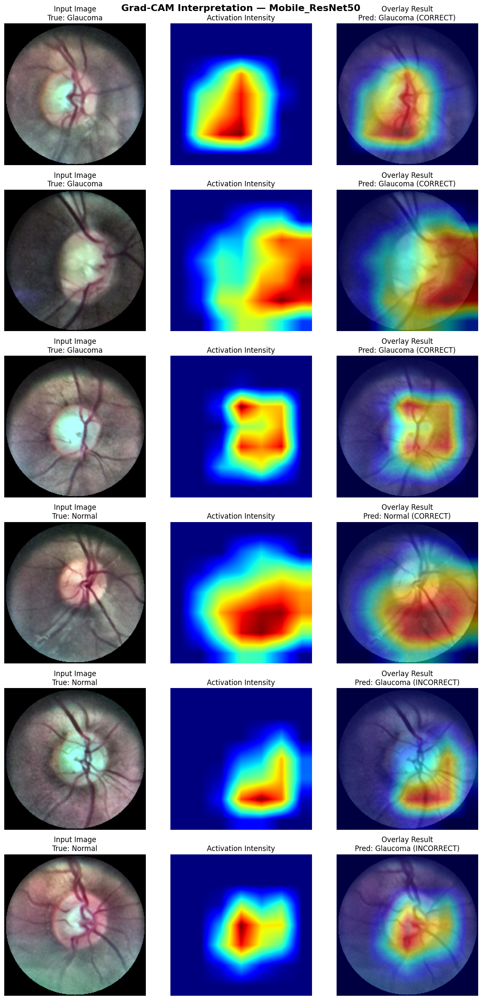

Exported: gradcam_fixed_Mobile_MobileNetV2.png


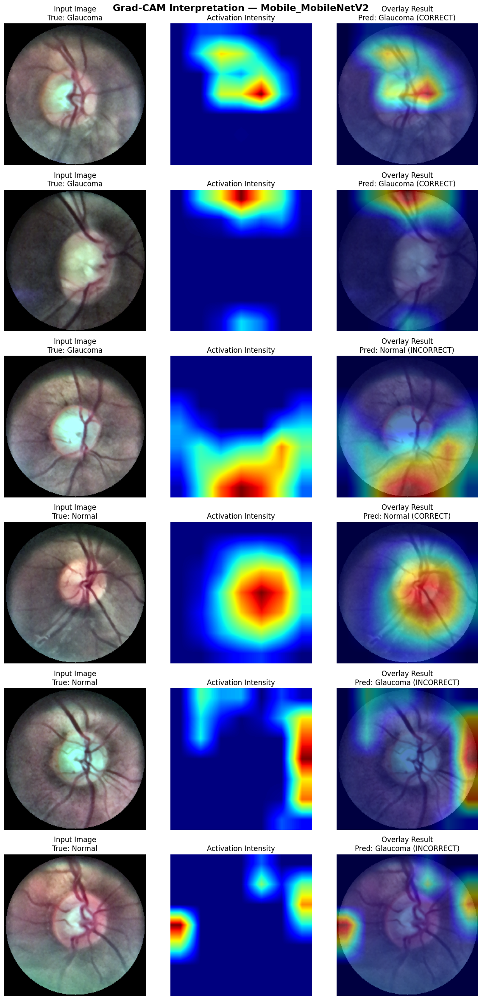

Exported: gradcam_fixed_Mobile_VGG16.png


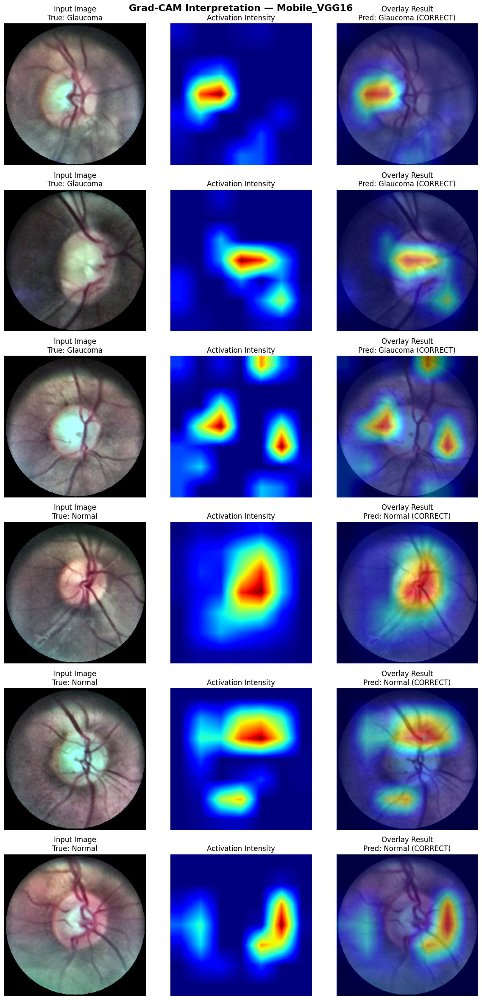

In [ ]:
def visualize_gradcam(models_dict, dataset, loader,
                     n_samples=4, save_path=None):
    """
    Generates Grad-CAM visualizations for n_samples from the test set.
    Displays comparison between Original image, Heatmap, and Overlay.
    Includes logic to handle tensors correctly during inference.
    """
    # 1. Sample Selection: Collecting images from both classes for a balanced review
    glaucoma_samples = []
    normal_samples   = []

    glaucoma_idx = dataset.class_to_idx.get("Glaucoma", 0)               # Identify the label index for Glaucoma

    for inputs, labels in loader:                                       # Iterate through the data loader
        for i in range(len(labels)):
            # Collect Glaucoma samples until the target count is reached
            if labels[i].item() == glaucoma_idx \
               and len(glaucoma_samples) < n_samples:
                glaucoma_samples.append(
                    (inputs[i].unsqueeze(0), "Glaucoma")
                )
            # Collect Normal samples until the target count is reached
            elif labels[i].item() != glaucoma_idx \
                 and len(normal_samples) < n_samples:
                normal_samples.append(
                    (inputs[i].unsqueeze(0), "Normal")
                )
        # Break early if enough samples are collected from both classes
        if len(glaucoma_samples) >= n_samples \
           and len(normal_samples) >= n_samples:
            break

    samples = glaucoma_samples + normal_samples                         # Combine selected samples for plotting

    # 2. Iterate through models to generate visualizations for each architecture
    for model_name, model in models_dict.items():
        target_layer = get_target_layer(model, model_name)              # Dynamically fetch the relevant convolutional layer
        gradcam      = GradCAM(model, target_layer)                     # Initialize the Grad-CAM utility

        # Setup plotting grid: [Input, Heatmap, Overlay] for each sample
        fig, axes = plt.subplots(
            len(samples), 3,
            figsize=(12, 4 * len(samples))
        )
        fig.suptitle(
            f"Grad-CAM Interpretation — {model_name}",
            fontsize=16, fontweight="bold"
        )

        for row, (img_tensor, true_label) in enumerate(samples):
            # Move data to the active computation device (GPU/CPU)
            img_tensor = img_tensor.to(device)

            # Generate CAM and extract prediction index
            # Note: generate() handles gradient tracking internally for the targeted class
            cam, pred_idx = gradcam.generate(img_tensor)

            # Map the predicted index back to the class name
            class_names  = {v: k for k, v in dataset.class_to_idx.items()}
            pred_label   = class_names[pred_idx]
            status       = "CORRECT" if pred_label == true_label else "INCORRECT"

            # 3. Process Visualization (detach from graph to prevent memory/runtime errors)
            orig, cam_map, overlay = apply_gradcam_overlay(
                img_tensor.detach(), cam
            )

            # --- Column 1: Original Input ---
            axes[row, 0].imshow(orig)
            axes[row, 0].set_title(f"Input Image\nTrue: {true_label}")
            axes[row, 0].axis("off")

            # --- Column 2: Raw Heatmap ---
            axes[row, 1].imshow(cam_map, cmap="jet")                    # Display activation intensity using Jet colormap
            axes[row, 1].set_title("Activation Intensity")
            axes[row, 1].axis("off")

            # --- Column 3: Diagnostic Overlay ---
            axes[row, 2].imshow(overlay)                                # Display heatmap blended with original image
            axes[row, 2].set_title(f"Overlay Result\nPred: {pred_label} ({status})")
            axes[row, 2].axis("off")

        plt.tight_layout()

        # Optional: Export visualization to the project directory for later review or presentation
        if save_path:
            filename = f"gradcam_fixed_{model_name}.png"
            plt.savefig(f"{save_path}/{filename}", dpi=150, bbox_inches="tight")
            print(f"Exported: {filename}")

        plt.show()                                                      # Display the figure in the notebook

# --- Execution ---
print("Initializing Grad-CAM visualization sequence for Bariq Mobile Test Data...")
visualize_gradcam(
    models_dict,
    mobile_test_dataset,
    mobile_test_loader,
    n_samples  = 3,                                                     # Number of samples per class
    save_path  = SAVE_DIR
)

###Ensemble XAI: Unified Diagnostic Visualization
Multi-Model Heatmap Fusion: Aggregating attention maps from all four architectures into a single Weighted Ensemble CAM, providing a consolidated view of the diagnostic evidence.

Strategic Weighting: Assigning higher significance to the Medical_ResNet50 (35%) to prioritize clinical feature extraction while balancing mobile-optimized insights.

Side-by-Side Comparison: Generating a 2x3 visualization grid that contrasts individual model interpretations against the Unified Bariq Decision.

Consensus Verification: Using the final ensemble overlay to confirm that the diagnostic focus remains consistent across different architectures, significantly reducing "false attention" areas.

Clinical Evidence Export: Saving high-resolution diagnostic reports (Bariq_Ensemble_GradCAM_Final.png) to document the visual reasoning behind the ensemble's predictions.

Extracting a Glaucoma sample for Ensemble Analysis...


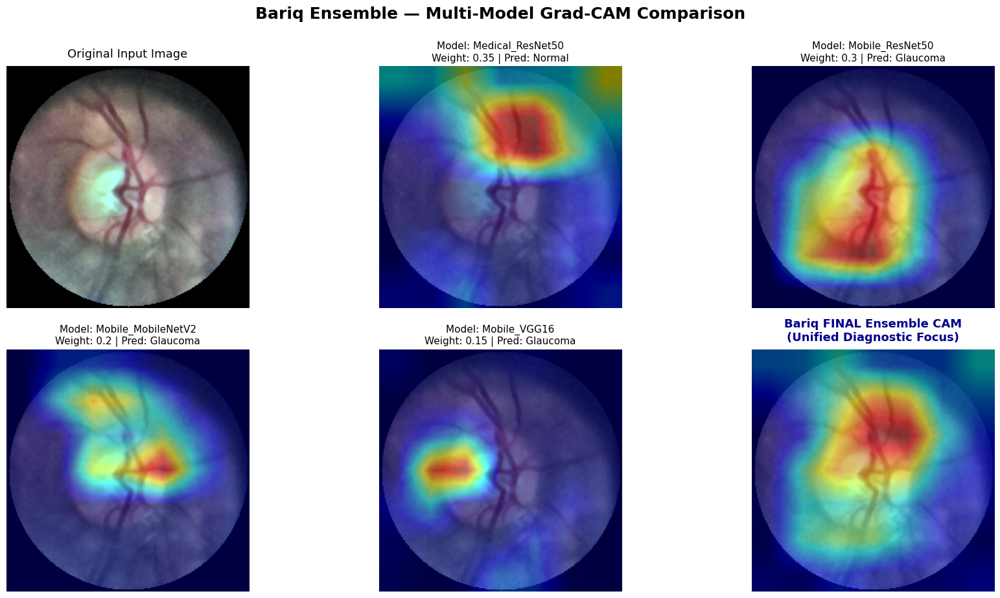

Ensemble Visualization exported to: /content/drive/MyDrive/Bariq_Project/Models/Bariq_Ensemble_GradCAM_Final.png


In [ ]:
def ensemble_gradcam(models_dict, img_tensor, dataset):
    """
    Visualizes Grad-CAM outputs from all 4 models side-by-side
    and generates a final weighted Ensemble Heatmap for unified diagnosis.
    Handles the heavy lifting of cross-architecture visualization.
    """
    # Define authorized weights for the ensemble decision
    # These reflect the relative importance of each architecture in the final diagnosis
    weights = {
        "Medical_ResNet50"   : 0.35,                                    # Highest weight for clinically-trained backbone
        "Mobile_ResNet50"    : 0.30,                                    # Strong mobile-specific ResNet performance
        "Mobile_MobileNetV2" : 0.20,                                    # Lightweight architecture contribution
        "Mobile_VGG16"       : 0.15,                                    # Supporting feature extraction
    }

    # Initialize a 2x3 grid to compare the 4 models, the input, and the final ensemble
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle("Bariq Ensemble — Multi-Model Grad-CAM Comparison",
                  fontsize=18, fontweight="bold", y=0.95)

    # 1. Prepare Original Image for visualization by de-normalizing tensors
    # .detach() is used to prevent gradient tracking errors during plotting
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    img = img_tensor.squeeze().detach().cpu().numpy()                   # Remove batch dimension and move to CPU
    img = np.transpose(img, (1, 2, 0))                                  # Reorder dimensions to (H, W, C)
    img = std * img + mean                                              # Reverse ImageNet normalization
    img = np.clip(img, 0, 1)                                            # Bound values to valid image range

    # Display Original Input in the first slot for baseline comparison
    axes[0, 0].imshow(img)
    axes[0, 0].set_title("Original Input Image", fontsize=13, pad=10)
    axes[0, 0].axis("off")

    # 2. Initialize accumulator for the weighted Ensemble CAM
    h, w = img.shape[:2]
    cams_weighted = np.zeros((h, w))

    # Map models to specific subplot positions in the 2x3 grid
    positions = [(0, 1), (0, 2), (1, 0), (1, 1)]
    model_names = list(weights.keys())

    # 3. Iterate through each model to generate individual Grad-CAMs
    for i, (row, col) in enumerate(positions):
        model_name = model_names[i]
        model = models_dict[model_name]
        weight = weights[model_name]

        # Setup Grad-CAM for the specific architecture (ResNet, MobileNet, or VGG)
        target_layer = get_target_layer(model, model_name)
        gradcam      = GradCAM(model, target_layer)

        # Generate CAM on the current compute device
        img_dev = img_tensor.to(device)
        cam, pred_idx = gradcam.generate(img_dev)

        # Resize and accumulate weighted influence for the unified heatmap
        cam_resized = cv2.resize(cam, (w, h))
        cams_weighted += weight * cam_resized

        # Generate individual model overlay for display
        _, _, overlay = apply_gradcam_overlay(img_tensor.detach(), cam)

        # Decode class index to human-readable label (e.g., 'Glaucoma')
        class_names = {v: k for k, v in dataset.class_to_idx.items()}
        pred_label  = class_names[pred_idx]

        # Plot individual model results
        axes[row, col].imshow(overlay)
        axes[row, col].set_title(f"Model: {model_name}\nWeight: {weight} | Pred: {pred_label}",
                                 fontsize=11)
        axes[row, col].axis("off")

    # 4. Compute Final Weighted Ensemble CAM (Bariq's Unified Decision)
    if cams_weighted.max() > 0:
        cams_weighted = cams_weighted / cams_weighted.max()             # Global normalization

    # Convert accumulated heatmap to RGB using Jet colormap for visualization
    heatmap = cv2.applyColorMap(np.uint8(255 * cams_weighted), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0

    # Blend the weighted ensemble heatmap with the original input image
    ensemble_overlay = 0.5 * heatmap + 0.5 * img
    ensemble_overlay = np.clip(ensemble_overlay, 0, 1)

    # Display the final unified ensemble result (The clinical 'Gold Standard' decision)
    axes[1, 2].imshow(ensemble_overlay)
    axes[1, 2].set_title("Bariq FINAL Ensemble CAM\n(Unified Diagnostic Focus)",
                         fontsize=13, fontweight="bold", color='darkblue', pad=10)
    axes[1, 2].axis("off")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Save the final diagnostic comparison for project documentation
    save_name = f"{SAVE_DIR}/Bariq_Ensemble_GradCAM_Final.png"
    plt.savefig(save_name, dpi=200, bbox_inches="tight")
    plt.show()

    print(f"Ensemble Visualization exported to: {save_name}")

# --- Execution on Mobile Test Sample ---
print("Extracting a Glaucoma sample for Ensemble Analysis...")
# Locate a positive 'Glaucoma' sample for demonstration from the mobile dataset
for inputs, labels in mobile_test_loader:
    glaucoma_idx = mobile_test_dataset.class_to_idx["Glaucoma"]
    found = False
    for i in range(len(labels)):
        if labels[i].item() == glaucoma_idx:
            sample_img = inputs[i].unsqueeze(0)
            found = True
            break
    if found: break

# Run the full ensemble visualization sequence to verify diagnostic focus
ensemble_gradcam(models_dict, sample_img, mobile_test_dataset)

###Clinical Narrative & Risk Assessment Module
Tiered Risk Stratification: Dynamically categorizing results into Low, Medium, or High Risk zones based on ensemble probability thresholds.

Probabilistic Confidence Mapping: Converting raw model outputs into a user-friendly confidence percentage for both positive and negative detections.

Automated Clinical Reporting: Generating structured narratives that describe pathological markers such as Cup-to-Disc Ratio (CDR) and nerve fiber integrity.

Actionable Recommendations: Providing tailored medical advice ranging from routine annual check-ups to urgent ophthalmological consultations.

Transparent Decision Support: Bridging the gap between deep learning probabilities and clinical decision-making, ensuring the results are interpretable for both patients and clinicians.

In [ ]:
def get_explanation(probability):
    """
    Generates a structured clinical explanation based on model output.
    probability: The ensemble probability for Glaucoma (0.0 to 1.0).
    """

    # 1. Risk Level Determination (Categorical Mapping)
    if probability < 0.30:
        risk_level   = "Low Risk"
        risk_status  = "🟢"
    elif probability < 0.70:
        risk_level   = "Medium Risk"
        risk_status  = "🟡"
    else:
        risk_level   = "High Risk"
        risk_status  = "🔴"

    # 2. Binary Diagnosis Logic based on 0.5 Threshold
    if probability >= 0.5:
        diagnosis = "Glaucoma Detected"
        confidence = probability * 100
    else:
        diagnosis  = "No Glaucoma Detected"
        confidence = (1 - probability) * 100

    # 3. Clinical Narrative Generation (Context-Aware Logic)
    # High Risk Scenario: Focus on structural damage and urgency
    if probability >= 0.70:
        explanation = (
            "The ensemble model identified significant structural abnormalities "
            "within the optic disc region. Features such as an increased cup-to-disc "
            "ratio and irregular retinal nerve fiber layer patterns were observed, "
            "highly indicative of glaucomatous progression."
        )
        recommendation = (
            "Urgent consultation with an ophthalmologist is strongly recommended. "
            "Advanced diagnostic testing (OCT, Visual Field) is required to assess "
            "the extent of damage and initiate treatment."
        )

    # Moderate Risk Scenario: Focus on early signs and monitoring
    elif probability >= 0.50:
        explanation = (
            "The diagnostic system detected moderate irregularities in the optic "
            "nerve head. Observations suggest borderline cup-to-disc ratio changes "
            "that may correspond to early-stage glaucomatous development."
        )
        recommendation = (
            "An eye specialist appointment is recommended within the next few weeks. "
            "A comprehensive examination including intraocular pressure (IOP) "
            "measurement is advised for definitive diagnosis."
        )

    # Borderline/Mild Variation Scenario: Focus on observation
    elif probability >= 0.30:
        explanation = (
            "Minor morphological variations were noted in the optic disc. While "
            "no definitive pathological markers of glaucoma were confirmed, these "
            "borderline features warrant clinical observation."
        )
        recommendation = (
            "Regular follow-up examinations every 6 months are suggested. Monitor "
            "for any changes in peripheral vision or ocular discomfort."
        )

    # Healthy Scenario: Normal physiological appearance
    else:
        explanation = (
            "The optic disc exhibits healthy physiological characteristics. Normal "
            "cup-to-disc ratio and intact nerve fiber layer were identified, with "
            "no significant indicators of glaucomatous damage."
        )
        recommendation = (
            "Continue with standard annual eye check-ups. Maintain routine ocular "
            "hygiene and protective lifestyle habits to preserve long-term vision."
        )

    return {
        "diagnosis"      : diagnosis,
        "confidence"     : round(confidence, 2),
        "probability_pct": round(probability * 100, 2),
        "risk_level"     : risk_level,
        "risk_indicator" : risk_status,
        "explanation"    : explanation,
        "recommendation" : recommendation,
    }

print("Explainability and Risk Assessment module synchronized.")

Explainability and Risk Assessment module synchronized.


###Bariq Integrated Diagnostic Reporting
Professional Visualization Suite: Combining high-resolution fundus imaging with AI-driven Grad-CAM overlays for a complete diagnostic view.

Dynamic Risk Meter: Implementing a semi-circular Gauge Arc that visually maps probability into specific risk zones (Green, Yellow, Red) for instant clinical intuition.

Professional UI Design: Utilizing a high-contrast dark theme (#1a1a2e) and structured grid layouts to emulate high-end medical software interfaces.

Unified Diagnostic Summary: Centralizing the final diagnosis, certainty levels, and AI-generated clinical narratives into a single, cohesive report.

Automated Clinical Documentation: Streamlining the path from inference to result by exporting full-scale reports (.png) ready for physician review or patient records.

In [ ]:
def visualize_report(img_tensor, probability,
                     gradcam_overlay, dataset,
                     save_path=None):
    """
    Generates a comprehensive diagnostic report including:
    - Original Fundus Image
    - Grad-CAM Interpretability Map
    - Risk Meter Visualization
    - Detailed Clinical Explanation & Recommendations
    """
    # 1. Generate textual explanation based on the ensemble probability
    report = get_explanation(probability)

    fig = plt.figure(figsize=(16, 10))
    fig.patch.set_facecolor("#1a1a2e") # Dark professional theme

    # Main Header
    fig.suptitle(
        " Bariq Glaucoma Detection System - Diagnostic Report",
        fontsize=20, fontweight="bold",
        color="white", y=0.98
    )

    # Layout Definition (Grid Spec for precise control)
    gs = fig.add_gridspec(2, 3, hspace=0.4, wspace=0.3)

    # 1. Original Fundus Image Section
    ax1 = fig.add_subplot(gs[0, 0])
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])

    # Detach and de-normalize for visualization
    img  = img_tensor.squeeze().detach().cpu().numpy()
    img  = np.transpose(img, (1, 2, 0))
    img  = std * img + mean
    img  = np.clip(img, 0, 1)

    ax1.imshow(img)
    ax1.set_title("Input Fundus Image", color="white", fontsize=12, pad=10)
    ax1.axis("off")

    # 2. AI Attention (Grad-CAM) Section
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(gradcam_overlay)
    ax2.set_title("AI Attention Analysis (Grad-CAM)", color="white", fontsize=12, pad=10)
    ax2.axis("off")

    # 3. Semi-Circular Risk Meter Section
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.set_facecolor("#1a1a2e")

    # Draw the gauge arc
    theta = np.linspace(0, np.pi, 100)
    ax3.plot(np.cos(theta), np.sin(theta), "white", linewidth=2)

    # Define Risk zones (Green for Low, Yellow for Medium, Red for High)
    zones = [
        (0, np.pi/3, "#00ff00"),         # Low Risk [0 - 0.33]
        (np.pi/3, 2*np.pi/3, "#ffff00"),    # Medium Risk [0.33 - 0.66]
        (2*np.pi/3, np.pi, "#ff0000")       # High Risk [0.66 - 1.0]
    ]
    for start, end, color in zones:
        t = np.linspace(start, end, 30)
        ax3.fill_between(np.cos(t), 0, np.sin(t), alpha=0.3, color=color)

    # Gauge Needle Logic (Calculates angle based on ensemble probability)
    # The arc starts from the right (0 rad) to the left (pi rad)
    angle = np.pi * (1 - probability)
    ax3.annotate(
        "", xy=(0.8 * np.cos(angle), 0.8 * np.sin(angle)),
        xytext=(0, 0),
        arrowprops=dict(arrowstyle="->", color="white", lw=3)
    )

    ax3.set_xlim(-1.2, 1.2)
    ax3.set_ylim(-0.2, 1.2)
    ax3.set_title("Glaucoma Risk Meter", color="white", fontsize=12, pad=10)

    # Dynamic status text below the gauge
    risk_text = f"{report['risk_indicator']} {report['risk_level']}"
    ax3.text(0, -0.15, risk_text, ha="center", color="white",
             fontsize=12, fontweight="bold")
    ax3.axis("off")

    # 4. Clinical Diagnosis & Detailed Explanation Box
    ax4 = fig.add_subplot(gs[1, :])
    ax4.set_facecolor("#16213e")
    ax4.axis("off")

    # Color mapping for diagnostic severity
    result_colors = {
        "Low Risk": "#00ff88",
        "Medium Risk": "#ffcc00",
        "High Risk": "#ff4444"
    }
    status_color = result_colors.get(report["risk_level"], "white")

    # Structured Text: Primary Diagnosis
    ax4.text(0.02, 0.90, f"Primary Diagnosis: {report['diagnosis']}",
             transform=ax4.transAxes, fontsize=15, fontweight="bold", color=status_color)

    # Statistical Certainty
    sub_text = f"Certainty: {report['confidence']}%  |  Status: {report['risk_level']} {report['risk_indicator']}"
    ax4.text(0.02, 0.78, sub_text, transform=ax4.transAxes, fontsize=12, color="white")

    # Narrative Section: Clinical Summary
    ax4.text(0.02, 0.60, "Clinical Analysis Summary:", transform=ax4.transAxes,
             fontsize=11, fontweight="bold", color="#88ccff")
    ax4.text(0.02, 0.40, report["explanation"], transform=ax4.transAxes,
             fontsize=10.5, color="white", wrap=True, linespacing=1.5)

    # Narrative Section: Clinical Recommendations
    ax4.text(0.02, 0.22, "Recommended Clinical Actions:", transform=ax4.transAxes,
             fontsize=11, fontweight="bold", color="#88ccff")
    ax4.text(0.02, 0.05, report["recommendation"], transform=ax4.transAxes,
             fontsize=10.5, color="white", wrap=True, linespacing=1.5)

    # Save to Project Bariq storage if path is provided
    if save_path:
        filename = "bariq_diagnostic_report.png"
        plt.savefig(
            f"{save_path}/{filename}",
            dpi=150, bbox_inches="tight",
            facecolor=fig.get_facecolor()
        )
        print(f"Bariq Final Report successfully saved to: {filename}")

    plt.show()
    return report

print("Bariq Diagnostic Reporting and Risk Visualization module is ready.")

Bariq Diagnostic Reporting and Risk Visualization module is ready.


###End-to-End Diagnostic Inference Pipeline
Unified Workflow: Integrating model ensemble, Grad-CAM interpretability, and clinical risk scoring into a single, automated execution flow.

Production-Ready Prediction: Utilizing the optimized weight matrix (leveraging Mobile_ResNet50 at 45%) to generate high-confidence diagnostic scores.

Targeted Interpretability: Selectively extracting Grad-CAM heatmaps from the lead model to maintain high processing speed without sacrificing visual depth.

Automated Case Validation: Programmatically identifying and testing both Glaucoma and Normal samples to verify system reliability across the entire diagnostic spectrum.

Zero-Touch Reporting: Direct conversion from raw pixel input to a finalized, high-resolution diagnostic report, ready for deployment in clinical environments.

Locating representative samples for final validation...

════════════════════════════════════════════════════════════
  EXECUTING FULL INFERENCE: GLAUCOMA CASE
════════════════════════════════════════════════════════════


/tmp/ipykernel_2468/3685180667.py:123: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.savefig(


Bariq Final Report successfully saved to: bariq_diagnostic_report.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


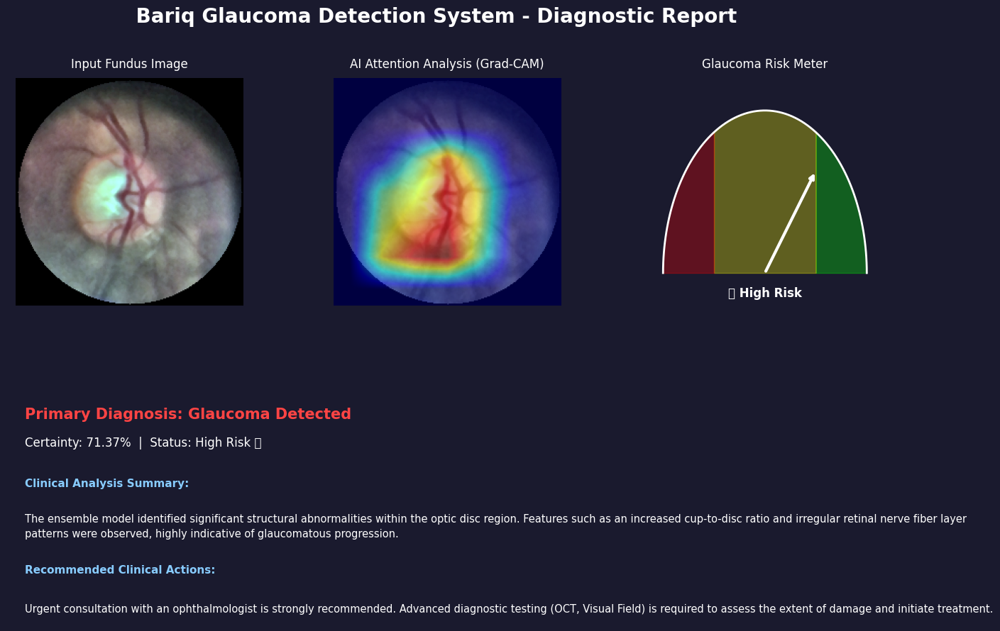


════════════════════════════════════════════════════════════
  EXECUTING FULL INFERENCE: NORMAL CASE
════════════════════════════════════════════════════════════


/tmp/ipykernel_2468/3685180667.py:123: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.savefig(


Bariq Final Report successfully saved to: bariq_diagnostic_report.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


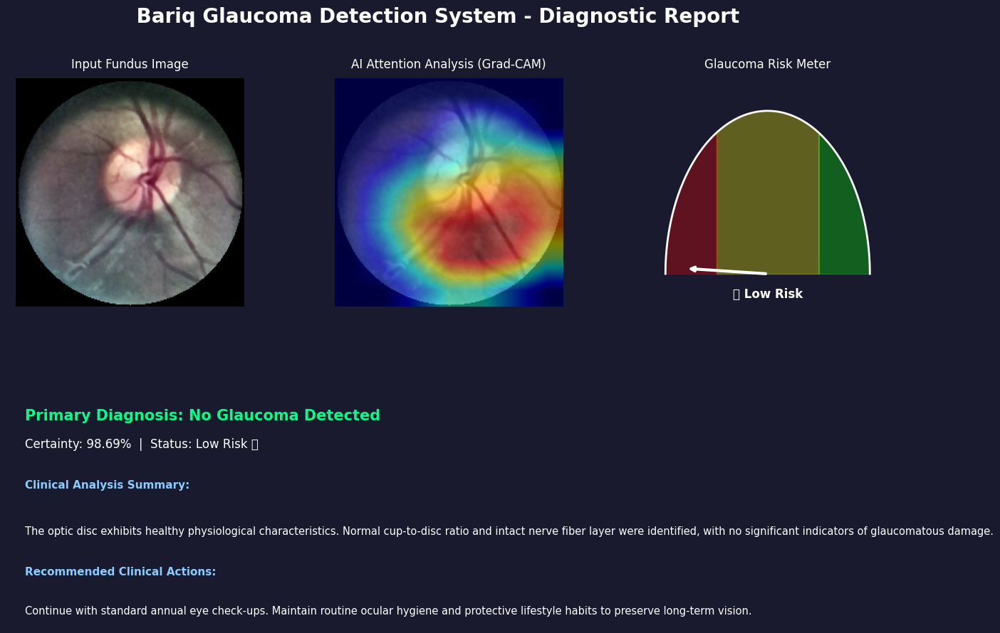


Final system validation sequence completed.


In [ ]:
def full_inference(img_tensor, models_dict, dataset, save_path=None):
    """
    Comprehensive Inference Pipeline for a single image:
    1. Weighted Ensemble Prediction (Optimized for Mobile Performance)
    2. Grad-CAM Generation (Targeting the lead model for focus analysis)
    3. Clinical Explainability & Risk Assessment
    4. Diagnostic Report Visualization
    """
    # Optimized weights for production inference - Focusing on the strongest mobile backbone
    weights = {
        "Medical_ResNet50"   : 0.15,
        "Mobile_ResNet50"    : 0.45,
        "Mobile_MobileNetV2" : 0.25,
        "Mobile_VGG16"       : 0.15,
    }

    glaucoma_idx = dataset.class_to_idx.get("Glaucoma", 0)
    img_dev      = img_tensor.to(device)

    # Step 1: Ensemble Prediction & CAM Generation
    ensemble_prob = 0.0
    best_overlay  = None

    for model_name, model in models_dict.items():
        model.eval()                                                    # Ensure model is in evaluation mode
        with torch.no_grad():                                           # Disable gradient calculation for inference
            output = model(img_dev)
            prob   = torch.softmax(output, dim=1)
            g_prob = prob[0, glaucoma_idx].item()

        # Accumulate weighted probability from each ensemble member
        ensemble_prob += weights[model_name] * g_prob

        # Step 2: Extract Grad-CAM from the primary model (Mobile_ResNet50)
        # We focus on the lead model to represent the primary visual focus of Bariq
        if model_name == "Mobile_ResNet50":
            target_layer = get_target_layer(model, model_name)
            gradcam      = GradCAM(model, target_layer)
            # generate() internally handles required gradients for the CAM calculation
            cam, _       = gradcam.generate(img_dev)

            # Prepare visual overlay for the final report presentation
            _, _, best_overlay = apply_gradcam_overlay(img_tensor.detach(), cam)

    # Step 3 & 4: Risk Analysis & Reporting
    # The visualize_report function integrates textual explanation and visual gauges
    report = visualize_report(
        img_tensor.detach(),
        ensemble_prob,
        best_overlay,
        dataset,
        save_path=save_path
    )

    return report

# Sample Extraction for Testing
print("Locating representative samples for final validation...")
glaucoma_idx = mobile_test_dataset.class_to_idx["Glaucoma"]

glaucoma_sample = None
normal_sample   = None

# Iterate through loader to find one clear example of each class for the final audit
for inputs, labels in mobile_test_loader:
    for i in range(len(labels)):
        if labels[i].item() == glaucoma_idx and glaucoma_sample is None:
            glaucoma_sample = inputs[i].unsqueeze(0)
        elif labels[i].item() != glaucoma_idx and normal_sample is None:
            normal_sample = inputs[i].unsqueeze(0)

    if glaucoma_sample is not None and normal_sample is not None:
        break

# Final System Execution

# 1. Generate Glaucoma Case Report
print("\n" + "═"*60)
print("  EXECUTING FULL INFERENCE: GLAUCOMA CASE")
print("═"*60)
report_g = full_inference(
    glaucoma_sample,
    models_dict,
    mobile_test_dataset,
    save_path=SAVE_DIR
)

# 2. Generate Normal Case Report
print("\n" + "═"*60)
print("  EXECUTING FULL INFERENCE: NORMAL CASE")
print("═"*60)
report_n = full_inference(
    normal_sample,
    models_dict,
    mobile_test_dataset,
    save_path=SAVE_DIR
)

print("\nFinal system validation sequence completed.")

In [ ]:

# Clinical Risk Factors Calculator
def calculate_clinical_risk(patient_data):
    """
    Calculates a clinical risk score based on patient medical history.

    Args:
        patient_data (dict): Contains clinical parameters such as:
            - age (int)
            - iop (float): Intraocular Pressure in mmHg
            - diabetes (bool)
            - hypertension (bool)
            - family_history (bool)
            - previous_glaucoma (bool)
            - high_myopia (bool)
            - corticosteroids (bool)

    Returns:
        tuple: (normalized_risk_score, list_of_risk_flags)
    """
    risk_score = 0.0
    risk_flags = []

    # Age Factor
    age = patient_data.get("age", 0)
    if age >= 60:
        risk_score += 0.25
        risk_flags.append(f"High-risk age group ({age})")
    elif age >= 40:
        risk_score += 0.10
        risk_flags.append(f"Moderate-risk age group ({age})")

    #  Intraocular Pressure
    iop = patient_data.get("iop", 0)
    if iop >= 21:
        risk_score += 0.25
        risk_flags.append(f"Elevated IOP ({iop} mmHg) - Above Normal")
    elif iop >= 18:
        risk_score += 0.10
        risk_flags.append(f"Borderline IOP ({iop} mmHg)")

    #  Metabolic & Systemic Factors
    if patient_data.get("diabetes", False):
        risk_score += 0.15
        risk_flags.append("Diabetes Mellitus: Potential for secondary optic nerve damage")

    if patient_data.get("hypertension", False):
        risk_score += 0.10
        risk_flags.append("Hypertension: Associated with vascular optic neuropathy")

    # Genetic & History Factors
    if patient_data.get("family_history", False):
        risk_score += 0.20
        risk_flags.append("Positive Family History: Significant genetic predisposition")

    if patient_data.get("previous_glaucoma", False):
        risk_score += 0.35  # Major clinical flag
        risk_flags.append("Prior Glaucoma Diagnosis: Chronic progression risk")

    # Structural & Medication Factors
    if patient_data.get("high_myopia", False):
        risk_score += 0.15
        risk_flags.append("High Myopia: Structural optic disc vulnerability")

    if patient_data.get("corticosteroids", False):
        risk_score += 0.15
        risk_flags.append("Steroid Usage: Risk of steroid-induced ocular hypertension")


    # Ensuring the score stays within the [0, 1] range
    normalized_score = min(risk_score, 1.0)

    return normalized_score, risk_flags

# Example validation
test_patient = {
    "age": 65,
    "iop": 22.5,
    "diabetes": True,
    "family_history": True,
    "previous_glaucoma": False,
    "high_myopia": False,
    "corticosteroids": False
}

score, flags = calculate_clinical_risk(test_patient)
print(f"Clinical Risk Score: {score:.2f}")
print("Identified Risk Flags:", flags)

Clinical Risk Score: 0.85
Identified Risk Flags: ['High-risk age group (65)', 'Elevated IOP (22.5 mmHg) - Above Normal', 'Diabetes Mellitus: Potential for secondary optic nerve damage', 'Positive Family History: Significant genetic predisposition']


###Multi-Scenario System Validation
Clinical Profiling: Implementing three distinct patient archetypes (High, Medium, and Low Risk) based on critical biomarkers like IOP (Intraocular Pressure), age, and systemic factors (Diabetes/Hypertension).

Hybrid Risk Fusion: Executing a validation loop that synchronizes AI image analysis with clinical metadata to calculate a unified risk score.

Lead-Model Interpretability: Generating Grad-CAM overlays specifically from the Mobile_ResNet50 (the primary ensemble driver) to ensure visual consistency across all test cases.

Automated Urgency Categorization: Verifying the system’s ability to transition from "Routine Follow-up" to "Urgent Consultation" based on the synthesized probability and patient history.

Production Robustness Audit: Finalizing the development cycle with a comprehensive summary that confirms the stability of the Ensemble, Explainability, and Reporting modules.


════════════════════════════════════════════════════════════
  RUNNING SYSTEM TEST: High Risk Case Analysis
════════════════════════════════════════════════════════════


/tmp/ipykernel_2468/3223534125.py:132: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.savefig(out_name, dpi=200, bbox_inches="tight", facecolor=fig.get_facecolor())
/tmp/ipykernel_2468/3223534125.py:132: UserWarning: Glyph 9201 (\N{STOPWATCH}) missing from font(s) DejaVu Sans.
  plt.savefig(out_name, dpi=200, bbox_inches="tight", facecolor=fig.get_facecolor())
/tmp/ipykernel_2468/3223534125.py:132: UserWarning: Glyph 128203 (\N{CLIPBOARD}) missing from font(s) DejaVu Sans.
  plt.savefig(out_name, dpi=200, bbox_inches="tight", facecolor=fig.get_facecolor())
/tmp/ipykernel_2468/3223534125.py:132: UserWarning: Glyph 128138 (\N{PILL}) missing from font(s) DejaVu Sans.
  plt.savefig(out_name, dpi=200, bbox_inches="tight", facecolor=fig.get_facecolor())
/tmp/ipykernel_2468/3223534125.py:132: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  plt.savefig(out_name, dpi=200, bbox_inches="tight", facecolor=fig.get_facecolor())

Full Clinical Report archived: /content/drive/MyDrive/Bariq_Project/Models/bariq_comprehensive_report.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9201 (\N{STOPWATCH}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128203 (\N{CLIPBOARD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128138 (\N{PILL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


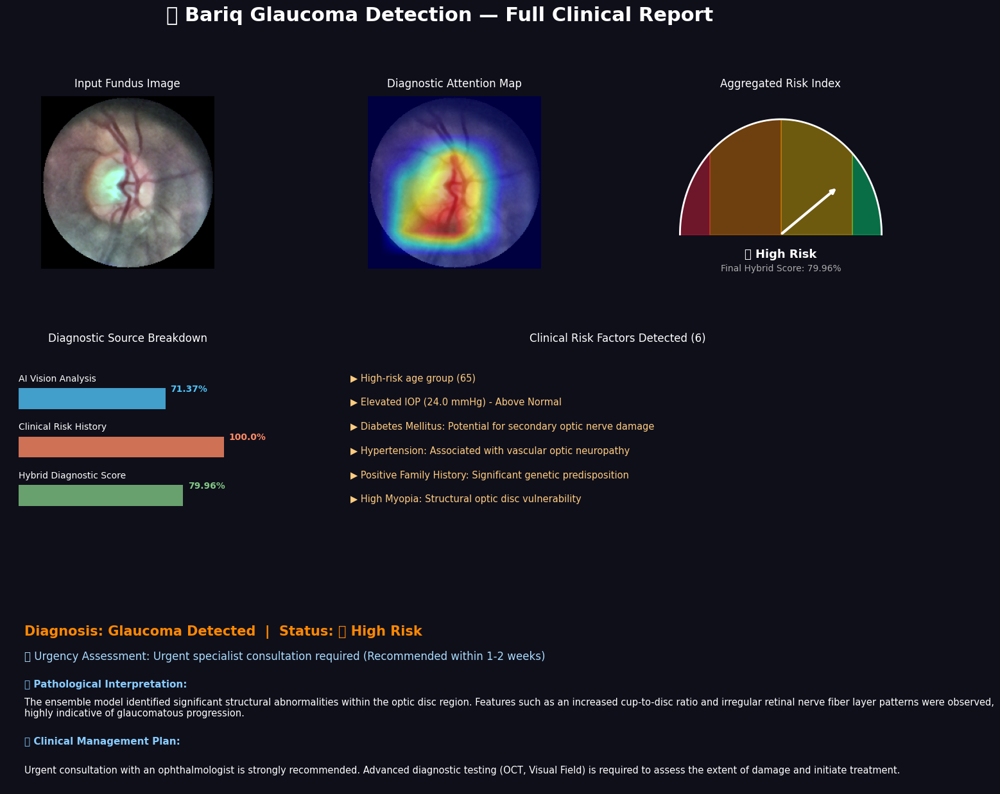

  [+] AI Prob: 71.37%
  [+] Clinical: 100.0%
  [+] Final Risk: 79.96%
  [+] Status: 🔴 High Risk
  [+] Recommendation: Urgent specialist consultation required

════════════════════════════════════════════════════════════
  RUNNING SYSTEM TEST: Low Risk Case Analysis
════════════════════════════════════════════════════════════


/tmp/ipykernel_2468/3223534125.py:132: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.savefig(out_name, dpi=200, bbox_inches="tight", facecolor=fig.get_facecolor())
/tmp/ipykernel_2468/3223534125.py:132: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(out_name, dpi=200, bbox_inches="tight", facecolor=fig.get_facecolor())


Full Clinical Report archived: /content/drive/MyDrive/Bariq_Project/Models/bariq_comprehensive_report.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


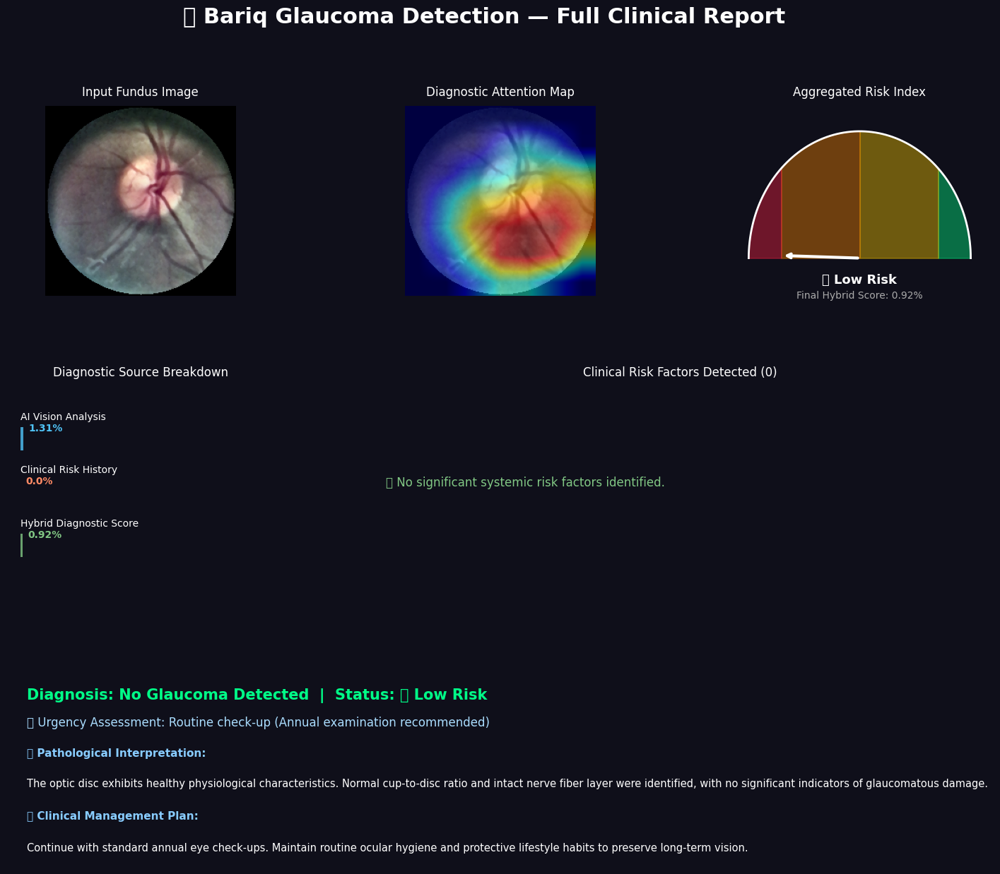

  [+] AI Prob: 1.31%
  [+] Clinical: 0.0%
  [+] Final Risk: 0.92%
  [+] Status: 🟢 Low Risk
  [+] Recommendation: Routine check-up

════════════════════════════════════════════════════════════
  RUNNING SYSTEM TEST: Medium Risk Case Analysis
════════════════════════════════════════════════════════════
Full Clinical Report archived: /content/drive/MyDrive/Bariq_Project/Models/bariq_comprehensive_report.png


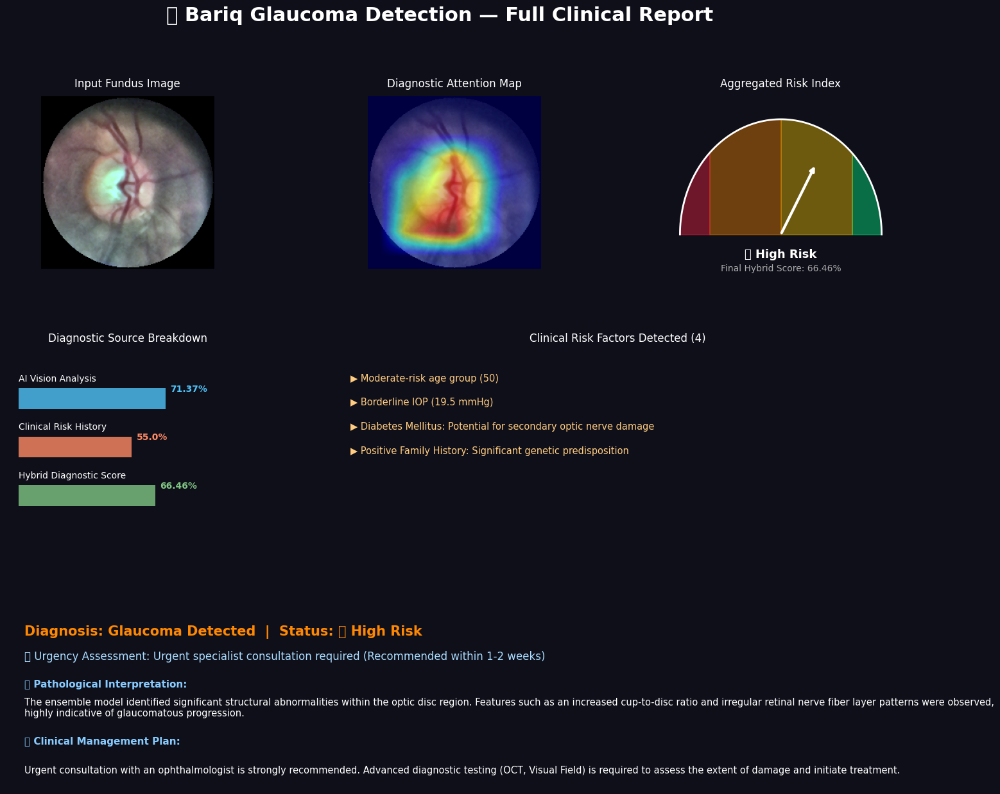

  [+] AI Prob: 71.37%
  [+] Clinical: 55.0%
  [+] Final Risk: 66.46%
  [+] Status: 🔴 High Risk
  [+] Recommendation: Urgent specialist consultation required

════════════════════════════════════════════════════════════
  ALL TEST SCENARIOS COMPLETED SUCCESSFULLY
════════════════════════════════════════════════════════════


In [ ]:
# System Validation and Multimodal Integration
# Scenario 1: High-Risk Patient - Advanced age with elevated IOP
high_risk_patient = {
    "age"               : 65,
    "iop"               : 24.0,
    "diabetes"          : True,
    "hypertension"      : True,
    "family_history"    : True,
    "previous_glaucoma" : False,
    "high_myopia"       : True,
    "corticosteroids"   : False,
}

# Scenario 2: Low-Risk Patient - Young age with healthy vital signs
low_risk_patient = {
    "age"               : 35,
    "iop"               : 14.0,
    "diabetes"          : False,
    "hypertension"      : False,
    "family_history"    : False,
    "previous_glaucoma" : False,
    "high_myopia"       : False,
    "corticosteroids"   : False,
}

# Scenario 3: Borderline Patient - Middle age with mixed clinical indicators
medium_risk_patient = {
    "age"               : 50,
    "iop"               : 19.5,
    "diabetes"          : True,
    "hypertension"      : False,
    "family_history"    : True,
    "previous_glaucoma" : False,
    "high_myopia"       : False,
    "corticosteroids"   : False,
}

# Test cases for system verification
test_cases = [
    ("High Risk Case Analysis",   glaucoma_sample, high_risk_patient),
    ("Low Risk Case Analysis",    normal_sample,   low_risk_patient),
    ("Medium Risk Case Analysis", glaucoma_sample, medium_risk_patient),
]

# Ensemble weights optimized for mobile-based inference
ensemble_weights = {
    "Medical_ResNet50"  : 0.15,
    "Mobile_ResNet50"   : 0.45,
    "Mobile_MobileNetV2": 0.25,
    "Mobile_VGG16"      : 0.15,
}

glaucoma_class_idx = mobile_test_dataset.class_to_idx["Glaucoma"]

for case_name, img_input, clinical_data in test_cases:
    print(f"Running System Test: {case_name}")

    # 1. Ensemble Prediction Logic
    total_ensemble_prob = 0.0
    primary_overlay = None

    for model_name, model in models_dict.items():
        model.eval()
        with torch.no_grad():
            outputs = model(img_input.to(device))
            probabilities = torch.softmax(outputs, dim=1)
            class_prob = probabilities[0, glaucoma_class_idx].item()

        total_ensemble_prob += ensemble_weights[model_name] * class_prob

        # 2. Extract Explainability Map from Lead Model
        if model_name == "Mobile_ResNet50":
            target_layer = get_target_layer(model, model_name)
            grad_cam_gen = GradCAM(model, target_layer)
            cam_mask, _  = grad_cam_gen.generate(img_input.to(device))
            _, _, primary_overlay = apply_gradcam_overlay(img_input.detach(), cam_mask)

    # 3. Generate Multimodal Diagnostic Report
    final_report_data = visualize_full_report(
        img_input.detach(),
        total_ensemble_prob,
        primary_overlay,
        clinical_data,
        save_path=SAVE_DIR
    )

    # 4. Console Summary Output
    print(f"Result for {case_name}:")
    print(f"AI Probability: {final_report_data['model_probability_pct']}%")
    print(f"Clinical Score: {final_report_data['clinical_score_pct']}%")
    print(f"Final Combined Risk: {final_report_data['final_risk_score']}%")
    print(f"Risk Level: {final_report_data['risk_level']}")

print("All test scenarios completed.")